In [62]:
import pyfpgrowth
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import random
from collections import defaultdict
import numpy as np

In [63]:
import pandas as pd
# Load your CSV data
data = pd.read_csv('transactions_list.csv')


data['Transaction'] = data['Transaction'].apply(lambda x: x.split(','))
transactions = data['Transaction'].tolist()

In [64]:
transactions_df = pd.DataFrame({"ID": [f"{i+1}" for i in range(len(transactions))],
                                "Items": [", ".join(trans) for trans in transactions]})
print(transactions_df.to_markdown(index=False, tablefmt="grid"))

+------+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|   ID | Items                                                                                                                                                                                                                                                                                                                                                                                                                       |
+======+==================================================================================================================================================

In [65]:
item_counts = defaultdict(int)
for trans in transactions:
    for item in trans:
        item_counts[item] += 1

# Sắp xếp theo thứ tự giảm dần
item_counts = dict(sorted(item_counts.items(), key=lambda x: x[1], reverse=True))
print("Item counts:", item_counts)
# ==================== Tạo bảng tần suất ====================
freq_df = pd.DataFrame(list(item_counts.items()), columns=["Item", "Frequency"])
print(freq_df.to_markdown(index=False, tablefmt="grid"))

Item counts: {'whole milk': 2513, 'other vegetables': 1903, 'rolls/buns': 1809, 'soda': 1715, 'yogurt': 1372, 'bottled water': 1087, 'root vegetables': 1072, 'tropical fruit': 1032, 'shopping bags': 969, 'sausage': 924, 'pastry': 875, 'citrus fruit': 814, 'bottled beer': 792, 'newspapers': 785, 'canned beer': 764, 'pip fruit': 744, 'fruit/vegetable juice': 711, 'whipped/sour cream': 705, 'brown bread': 638, 'domestic eggs': 624, 'frankfurter': 580, 'margarine': 576, 'coffee': 571, 'pork': 567, 'butter': 545, 'curd': 524, 'beef': 516, 'napkins': 515, 'chocolate': 488, 'frozen vegetables': 473, 'chicken': 422, 'white bread': 414, 'cream cheese': 390, 'waffles': 378, 'salty snack': 372, 'long life bakery product': 368, 'dessert': 365, 'sugar': 333, 'UHT-milk': 329, 'hamburger meat': 327, 'berries': 327, 'hygiene articles': 324, 'onions': 305, 'specialty chocolate': 299, 'candy': 294, 'misc. beverages': 279, 'frozen meals': 279, 'oil': 276, 'butter milk': 275, 'specialty bar': 269, 'bevera

In [66]:
mapping = {}
count = 1
for _, row in freq_df.iterrows():
    mapping[row["Item"]] = count
    count += 1

# In ra mapping để kiểm tra
print("Mapping (Item -> Key):")
print(mapping)

Mapping (Item -> Key):
{'whole milk': 1, 'other vegetables': 2, 'rolls/buns': 3, 'soda': 4, 'yogurt': 5, 'bottled water': 6, 'root vegetables': 7, 'tropical fruit': 8, 'shopping bags': 9, 'sausage': 10, 'pastry': 11, 'citrus fruit': 12, 'bottled beer': 13, 'newspapers': 14, 'canned beer': 15, 'pip fruit': 16, 'fruit/vegetable juice': 17, 'whipped/sour cream': 18, 'brown bread': 19, 'domestic eggs': 20, 'frankfurter': 21, 'margarine': 22, 'coffee': 23, 'pork': 24, 'butter': 25, 'curd': 26, 'beef': 27, 'napkins': 28, 'chocolate': 29, 'frozen vegetables': 30, 'chicken': 31, 'white bread': 32, 'cream cheese': 33, 'waffles': 34, 'salty snack': 35, 'long life bakery product': 36, 'dessert': 37, 'sugar': 38, 'UHT-milk': 39, 'hamburger meat': 40, 'berries': 41, 'hygiene articles': 42, 'onions': 43, 'specialty chocolate': 44, 'candy': 45, 'misc. beverages': 46, 'frozen meals': 47, 'oil': 48, 'butter milk': 49, 'specialty bar': 50, 'beverages': 51, 'ham': 52, 'meat': 53, 'ice cream': 54, 'hard c

In [67]:
transactions_df = pd.read_csv("transactions_list.csv")

# Bước 3: Xử lý từng dòng trong cột "Transaction"
def replace_items(transaction_str):
    # Tách các item, loại bỏ khoảng trắng thừa
    items = [item.strip() for item in transaction_str.split(',')]
    # Thay thế mỗi item bằng key nếu có trong mapping
    replaced_items = [str(mapping.get(item, item)) for item in items]
    # Nối lại các key thành chuỗi, phân cách bằng dấu phẩy
    return ",".join(replaced_items)

# Áp dụng hàm cho cột "Transaction"
transactions_df["Transaction"] = transactions_df["Transaction"].apply(replace_items)

# Bước 4: Lưu kết quả ra file mới (hoặc ghi đè file cũ nếu cần)
transactions_df.to_csv("transactions_list_encoded.csv", index=False)

print("Updated transactions_list_encoded.csv:")
print(transactions_df)

Updated transactions_list_encoded.csv:
                                           Transaction
0                                         12,64,22,149
1                                               8,5,23
2                                                    1
3                                          16,5,33,123
4                                            2,1,87,36
...                                                ...
9830  10,31,27,40,12,58,7,1,25,18,67,23,61,35,29,42,28
9831                                               142
9832                       31,12,2,25,5,82,20,3,122,79
9833                                         64,6,4,13
9834                                      31,8,2,108,9

[9835 rows x 1 columns]


In [68]:
def sort_transaction(transaction_str):
    # Tách chuỗi theo dấu phẩy và chuyển sang số nguyên
    keys = [int(item.strip()) for item in transaction_str.split(',') if item.strip()]
    # Sắp xếp các key theo thứ tự tăng dần
    keys_sorted = sorted(keys)
    # Nối lại thành chuỗi, chuyển từng key về dạng chuỗi
    return ",".join(str(key) for key in keys_sorted)

# Đọc file transactions_list_encoded.csv
df = pd.read_csv("transactions_list_encoded.csv")

# Áp dụng hàm sort_transaction cho cột "Transaction"
df["Transaction"] = df["Transaction"].apply(sort_transaction)

print("Sorted Transactions (each transaction sorted from smallest to largest):")
print(df)

Sorted Transactions (each transaction sorted from smallest to largest):
                                           Transaction
0                                         12,22,64,149
1                                               5,8,23
2                                                    1
3                                          5,16,33,123
4                                            1,2,36,87
...                                                ...
9830  1,7,10,12,18,23,25,27,28,29,31,35,40,42,58,61,67
9831                                               142
9832                       2,3,5,12,20,25,31,79,82,122
9833                                         4,6,13,64
9834                                      2,8,9,31,108

[9835 rows x 1 columns]


In [69]:
# ==================== BƯỚC 3: XÂY DỰNG FP-TREE ====================
class FPTreeNode:
    def __init__(self, item, count, parent):
        self.item = item
        self.count = count
        self.parent = parent
        self.children = {}
        self.link = None  # Liên kết với node cùng item
    
    def increase(self, count):
        self.count += count

class FPTree:
    def __init__(self):
        self.root = FPTreeNode("Root", 0, None)
        self.header_table = defaultdict(list)  # Lưu danh sách các node có cùng item

    def insert_transaction(self, transaction, count=1):
        current_node = self.root
        for item in transaction:
            if item in current_node.children:
                current_node.children[item].increase(count)
            else:
                new_node = FPTreeNode(item, count, current_node)
                current_node.children[item] = new_node
                self.header_table[item].append(new_node)  # Lưu các node có cùng item
            current_node = current_node.children[item]

    def build_tree(self, transactions, item_counts):
        """
        Với mỗi giao dịch, ta lọc các item có trong item_counts (nếu cần)
        và sắp xếp theo thứ tự tăng dần (ở đây đã được sắp xếp trong file nên chỉ cần lọc các item hợp lệ).
        Sau đó, chèn giao dịch vào FP-Tree.
        """
        for transaction in transactions:
            filtered_transaction = [item for item in transaction if item in item_counts]
            sorted_items = sorted(filtered_transaction)
            self.insert_transaction(sorted_items)

# Xây dựng FP-Tree từ các giao dịch đã xử lý
fp_tree = FPTree()
fp_tree.build_tree(transactions, item_counts)

# (Tùy chọn) In thông tin FP-Tree (cấu trúc cây)
def print_tree(node, indent=0):
    # Nếu node không phải là "Root", ta sẽ decode key thành tên gốc nếu có
    if node.item != "Root":
        decoded_item = reverse_mapping.get(node.item, node.item)
    else:
        decoded_item = node.item
    print("  " * indent + f"{decoded_item} ({node.count})")
    for child in node.children.values():
        print_tree(child, indent+1)

print("\nFP-Tree structure (decoded):")
print_tree(fp_tree.root)


FP-Tree structure (decoded):
Root (0)


NameError: name 'reverse_mapping' is not defined

+-----------------------------------------------------------------------------------------------+
| Transaction                                                                                   |
+===============================================================================================+
| 12,22,64,149                                                                                  |
+-----------------------------------------------------------------------------------------------+
| 5,8,23                                                                                        |
+-----------------------------------------------------------------------------------------------+
| 1                                                                                             |
+-----------------------------------------------------------------------------------------------+
| 5,16,33,123                                                                                   |
+-------------------

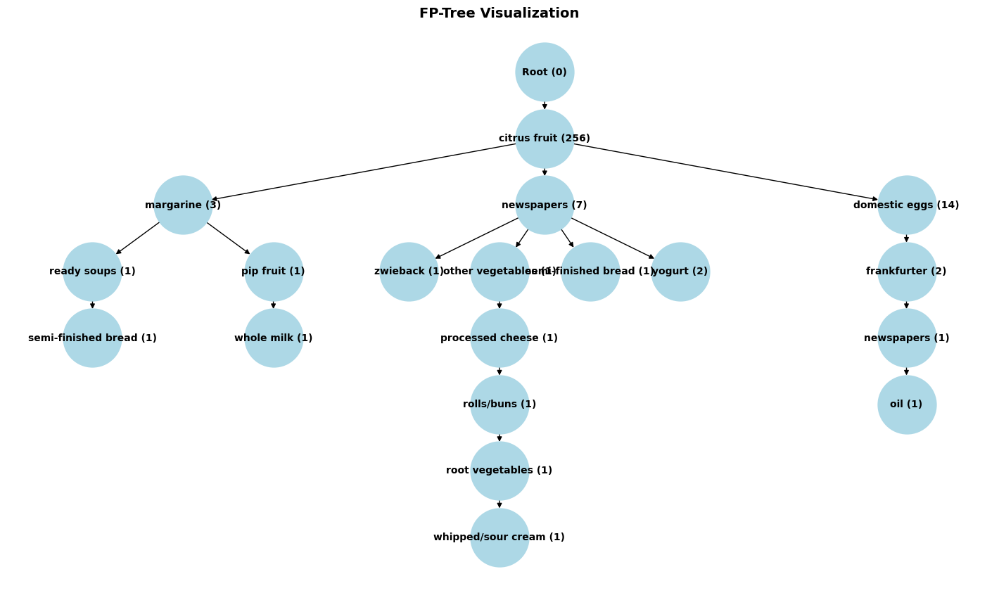

In [ ]:
# ==================== Vẽ FP-Tree ====================
G = nx.DiGraph()
node_labels = {}  # Lưu nhãn của node
max_nodes = 20  # Giới hạn số lượng node hiển thị
node_count = 0   # Đếm số lượng node đã thêm

def add_edges(node, parent_node=None):
    global node_count
    if node_count >= max_nodes:
        return  # Dừng nếu đạt giới hạn

    node_id = id(node)
    # Nếu không phải node "Root", decode key thành tên gốc
    if node.item != "Root":
        label_item = reverse_mapping.get(node.item, node.item)
    else:
        label_item = node.item
    node_label = f"{label_item} ({node.count})"  # Nhãn hiển thị

    G.add_node(node_id)
    node_labels[node_id] = node_label
    node_count += 1

    if parent_node:
        parent_id = id(parent_node)
        G.add_edge(parent_id, node_id)

    for child in node.children.values():
        add_edges(child, node)

# Bắt đầu từ node gốc của FP-Tree
add_edges(fp_tree.root)

def hierarchy_pos(G, root, width=1.5, vert_gap=0.3, xcenter=0.5, pos=None, level=0):
    if pos is None:
        pos = {root: (xcenter, 1)}
    else:
        pos[root] = (xcenter, 1 - level * vert_gap)
    
    children = list(G.successors(root))
    if not children:
        return pos

    dx = width / max(len(children), 1)
    nextx = xcenter - width / 2 + dx / 2
    for child in children:
        pos = hierarchy_pos(G, child, width=dx, vert_gap=vert_gap, xcenter=nextx, pos=pos, level=level+1)
        nextx += dx

    return pos

plt.figure(figsize=(14, 8))
root_id = id(fp_tree.root)
pos = hierarchy_pos(G, root=root_id)
nx.draw(G, pos, labels=node_labels, with_labels=True, node_size=3500,
        node_color="lightblue", edge_color="black", linewidths=1.5,
        font_size=10, font_weight="bold", arrows=True)
plt.title("FP-Tree Visualization (Decoded)", fontsize=14, fontweight="bold")
plt.show()